In [13]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import requests
import matplotlib.image as mpimg

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms

from urllib.parse import urlencode

%config InlineBackend.figure_format='retina'

In [2]:
base_url = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
public_key = 'https://disk.yandex.ru/d/kZ4U3l9vqLTX4w'

final_url = base_url + urlencode(dict(public_key=public_key))
response = requests.get(final_url)
download_url = response.json()['href']

download_response = requests.get(download_url)
with open('karta.zip', 'wb') as f:
    f.write(download_response.content)

In [3]:
! unzip karta.zip

Archive:  karta.zip
  inflating: 1.jpg                   
  inflating: 2.jpg                   
  inflating: 3.jpg                   
  inflating: 4.jpg                   
  inflating: 5.jpg                   
  inflating: 6.jpg                   
  inflating: 7.jpg                   
  inflating: 8.jpg                   


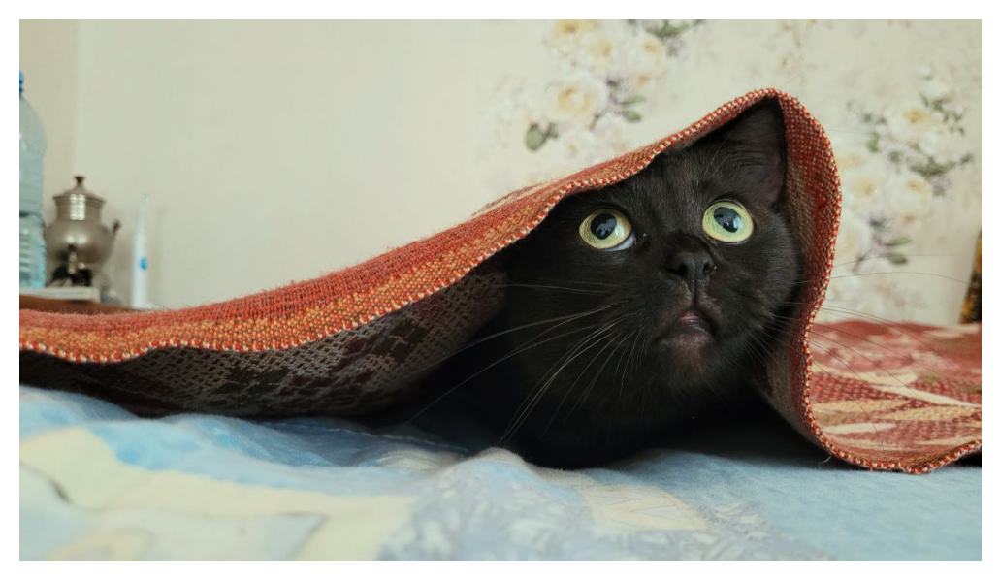

In [294]:
i = 2
img = mpimg.imread(f'{i}.jpg')
img = img / np.linalg.norm(img.reshape(-1, 3), ord=np.inf, axis=0, keepdims=True).reshape(1, 1, 3)
plt.imshow(img)
plt.axis("off");

In [295]:
img.shape

(720, 1280, 3)

In [361]:
kernel = np.array([
    [
                    [[1,1,1],
                   [1,1, 1],
                   [1,1,1]],
                  [[ 1,0,0],
                   [0,1, 0],
                   [0,0,1]],

                   [[1,0,0],
                   [0,1, 0],
                   [0,0,1]]],
     [[[1,0,0],
                   [0,1, 0],
                   [0,0,1]],
                   [[1,1,1],
                   [1,1, 1],
                   [1,1,1]],
                   [[1,0,0],
                   [0,1, 0],
                   [0,0,1]]],

    [[[0,0,0],
                   [0,1, 0],
                   [0,0,0]],
                   [[1,0,0],
                   [0,1, 0],
                   [0,0,1]],
                   [[1,1,1],
                   [1,1, 1],
                   [1,1,1]]],







                   ])/10

In [360]:
conv = torch.nn.Conv2d(in_channels=3, out_channels=3, stride= 1, kernel_size = 20, padding=1,bias=False, device='cpu')

In [362]:
kernel = np.array([
    [np.ones((20, 20)), np.eye(20), np.eye(20)],
    [np.eye(20), np.ones((20, 20)), np.eye(20)],
    [np.eye(20), np.eye(20), np.ones((20, 20))]
])/400

In [363]:
kernel

array([[[[0.0025, 0.0025, 0.0025, ..., 0.0025, 0.0025, 0.0025],
         [0.0025, 0.0025, 0.0025, ..., 0.0025, 0.0025, 0.0025],
         [0.0025, 0.0025, 0.0025, ..., 0.0025, 0.0025, 0.0025],
         ...,
         [0.0025, 0.0025, 0.0025, ..., 0.0025, 0.0025, 0.0025],
         [0.0025, 0.0025, 0.0025, ..., 0.0025, 0.0025, 0.0025],
         [0.0025, 0.0025, 0.0025, ..., 0.0025, 0.0025, 0.0025]],

        [[0.0025, 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
         [0.    , 0.0025, 0.    , ..., 0.    , 0.    , 0.    ],
         [0.    , 0.    , 0.0025, ..., 0.    , 0.    , 0.    ],
         ...,
         [0.    , 0.    , 0.    , ..., 0.0025, 0.    , 0.    ],
         [0.    , 0.    , 0.    , ..., 0.    , 0.0025, 0.    ],
         [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.0025]],

        [[0.0025, 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
         [0.    , 0.0025, 0.    , ..., 0.    , 0.    , 0.    ],
         [0.    , 0.    , 0.0025, ..., 0.    , 0.    , 0.    ],
        

In [364]:
conv.weight.shape

torch.Size([3, 3, 20, 20])

In [365]:
conv.weight = torch.nn.Parameter(torch.tensor(kernel, dtype=torch.float32).reshape(conv.weight.shape))

In [366]:
res = conv(torch.tensor(img.transpose(2,0,1), dtype=torch.float32))

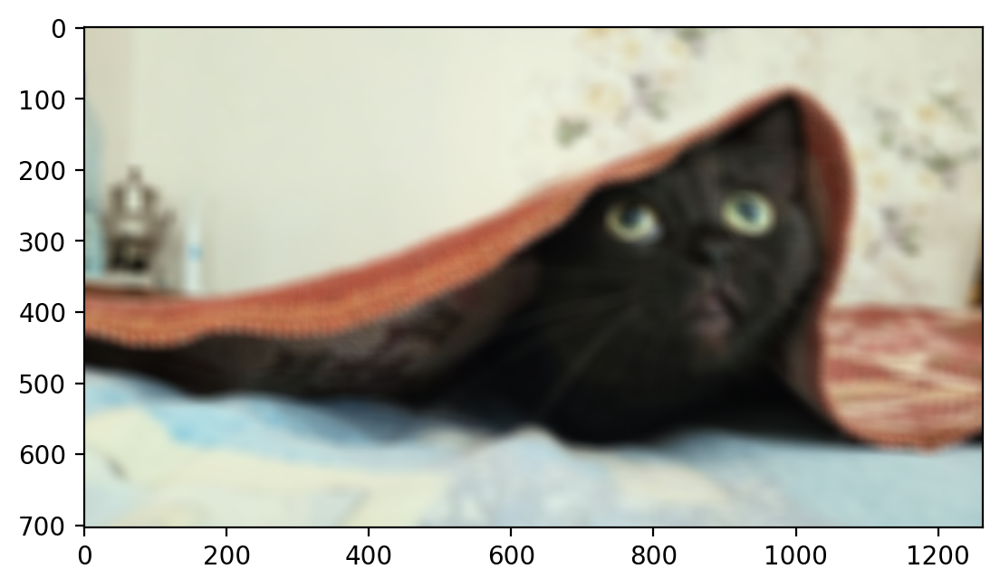

In [367]:
plt.imshow(res.detach().numpy().transpose(1,2,0), cmap = 'gray')

# SIMPLE AUTOENCODER

In [4]:
import numpy as np
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import matplotlib.pyplot as plt
import torchvision
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
%matplotlib inline

In [5]:
dataset = datasets.CelebA(
    root='../datasets/celebA/train_images',
    split='train',
    target_type='identity',
    transform=transforms.Compose([transforms.ToTensor()]),
    download=True)

Downloading...
From (original): https://drive.google.com/uc?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM
From (redirected): https://drive.usercontent.google.com/download?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM&confirm=t&uuid=3ff676d4-25d9-4b80-b159-24ed9d5e0d56
To: /datasets/celebA/train_images/celeba/img_align_celeba.zip
100%|██████████| 1.44G/1.44G [00:24<00:00, 58.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=0B7EVK8r0v71pblRyaVFSWGxPY0U
To: /datasets/celebA/train_images/celeba/list_attr_celeba.txt
100%|██████████| 26.7M/26.7M [00:00<00:00, 118MB/s]
Downloading...
From: https://drive.google.com/uc?id=1_ee_0u7vcNLOfNLegJRHmolfH5ICW-XS
To: /datasets/celebA/train_images/celeba/identity_CelebA.txt
100%|██████████| 3.42M/3.42M [00:00<00:00, 203MB/s]
Downloading...
From: https://drive.google.com/uc?id=0B7EVK8r0v71pbThiMVRxWXZ4dU0
To: /datasets/celebA/train_images/celeba/list_bbox_celeba.txt
100%|██████████| 6.08M/6.08M [00:00<00:00, 49.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=0B

In [6]:
%pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=896cc29e5aeb033c8826c8d6152e22c3a411a9506500e6b10982bd930656a9f1
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [8]:
import wget
import zipfile
import os
data_root = "datasets"

base_url = "https://graal.ift.ulaval.ca/public/celeba/"

file_list = [
    "img_align_celeba.zip",
    "list_attr_celeba.txt",
    "identity_CelebA.txt",
    "list_bbox_celeba.txt",
    "list_landmarks_align_celeba.txt",
    "list_eval_partition.txt",
]

# Path to folder with the dataset
dataset_folder = f"{data_root}/celeba"
os.makedirs(dataset_folder, exist_ok=True)

for file in file_list:
    url = f"{base_url}/{file}"
    if not os.path.exists(f"{dataset_folder}/{file}"):
        wget.download(url, f"{dataset_folder}/{file}")

with zipfile.ZipFile(f"{dataset_folder}/img_align_celeba.zip", "r") as ziphandler:
    ziphandler.extractall(dataset_folder)

In [11]:
num_epochs = 5
learning_rate = 0.01
batch_size = 16

imagenet_mean = [0.485, 0.456, 0.406]  # mean of the ImageNet dataset for normalizing
imagenet_std = [0.229, 0.224, 0.225]  # std of the ImageNet dataset for normalizing

image_size = 224

In [12]:
import torchvision.transforms as tfms

transforms = tfms.Compose(
    [
        tfms.Resize((image_size, image_size)),
        tfms.ToTensor(),
        tfms.Normalize(imagenet_mean, imagenet_std),
    ]
)
train_dataset = datasets.CelebA(data_root, split="train", target_type=["attr", "landmarks"], transform=transforms)
valid_dataset = datasets.CelebA(data_root, split="valid", target_type=["attr", "landmarks"], transform=transforms)
test_dataset = datasets.CelebA(data_root, split="test", target_type=["attr", "landmarks"], transform=transforms)

In [13]:
from torch.utils.data import DataLoader, Subset, Dataset

train_subset = Subset(train_dataset, np.arange(1, 50000))
valid_subset = Subset(valid_dataset, np.arange(1, 2000))
test_subset = Subset(test_dataset, np.arange(1, 1000))
train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(valid_subset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False)

2


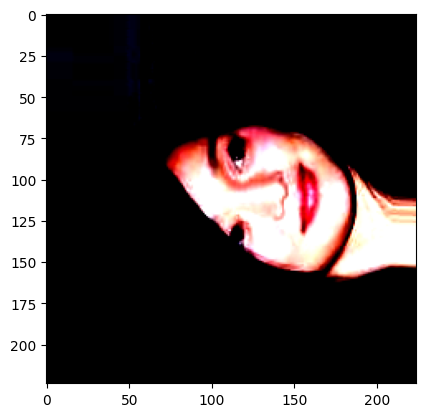

In [14]:
for i in test_dataloader:

  print(len(i))
  plt.imshow(i[0].detach().numpy()[7].transpose(2,1, 0))
  break

In [15]:
image_h = 224
image_w = 224

In [16]:
def plot_gallery(images, h, w, n_row=4, n_col=4):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.5 * n_col, 1.7 * n_row))
    # plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for image in test_dataloader:
          # print(i[0].shape)

          images = image[0].detach().numpy()
          break
    print(images[0].shape, len(images))
    for i in range(n_row * n_col):



        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].transpose(1,2,0),  interpolation='nearest')
        plt.xticks(())
        plt.yticks(())

(3, 224, 224) 16


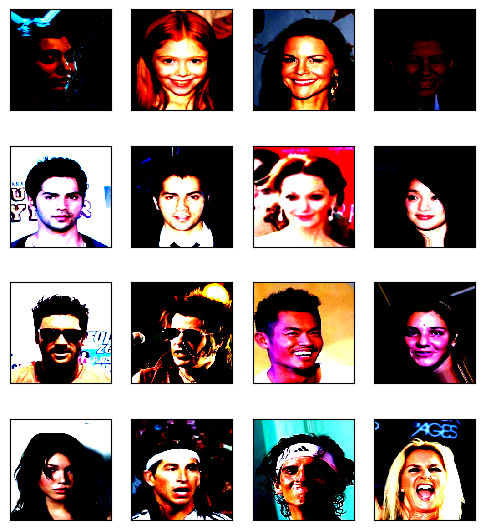

In [17]:
plot_gallery(test_dataloader, image_h, image_w)

In [431]:
224*224

50176

In [31]:
dim_hidden = 100
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        #TODO
        self.flatten = nn.Flatten()
        self.encoder = nn.Sequential(
            nn.Linear(in_features=150528, out_features=20000, bias=False),
            nn.ReLU(),
            nn.Linear(in_features=20000, out_features=5000, bias=False),
            nn.ReLU(),
            nn.Linear(in_features=5000, out_features=1000, bias=False),
            nn.ReLU(),
            nn.Linear(1000, dim_hidden, bias=False),
            nn.ReLU()

        )
        self.decoder = nn.Sequential(
            nn.Linear(dim_hidden, 1000, bias=False),
            nn.ReLU(),
            nn.Linear( 1000, 5000, bias=False),
            nn.ReLU(),
            nn.Linear(5000, 20000, bias=False),
            nn.ReLU(),
            nn.Linear(20000, 150528,  bias=False),
            # nn.Sigmoid()
            )

    def forward(self, x):

        #TODO

        x = self.flatten(x)
        latent_code = self.encoder(x)
        reconstruction = self.decoder(latent_code)

        return reconstruction, latent_code

In [32]:
def init_weights(m):
   if type(m) == nn.Linear:
        torch.nn.init.xavier_uniform(m.weight)
   def init_weights(self):
      for m in self.modules():
        if hasattr(m, 'weight') and m.weight.dim()>1:
          torch.nn.init.xavier_uniform_(m.weight.data)

        # m.bias.data.fill_(0.0)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
autoencoder = Autoencoder()
autoencoder.apply(init_weights)
autoencoder = autoencoder.to(device)

cuda:0


In [ ]:

criterion = torch.nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters())

In [22]:
from IPython import display
import matplotlib.pyplot as plt
def plot_loss_and_accuracy(loss_history, clear_output=True):
    if clear_output:
        display.clear_output(wait=True)
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    if loss_history:
        ax.semilogy(loss_history)
        ax.set_title('Training loss')
        ax.set_xlabel('# batches processed')
        ax.set_ylabel('loss value')

    # if len(train_accuracy) > 0:
    #     ax[1].plot(train_accuracy, '*-b', label='train')
    #     ax[1].plot(val_accuracy, '*-r', label='test')
    #     ax[1].set_title('Accuracy')
    #     ax[1].legend()
    #     ax[1].set_xlabel('# epochs processed')
    #     ax[1].set_ylabel('accuracy value')

    plt.show()


In [30]:
for X, _ in train_dataloader:
            # Perform one step of minibatch stochastic gradient descent
      print(X.shape)
      X = X.to(device)
      # >>> your solution here <<<
      nn_output = autoencoder(X)
      break

torch.Size([16, 3, 224, 224])


RuntimeError: mat1 and mat2 shapes cannot be multiplied (16x150528 and 50176x20000)

In [26]:
# Train your autoencoder
# Visualize progress in reconstruction and loss decay
def train(epochs, net, criterion, optimizer, train_loader, val_loader,scheduler=None, verbose=True, save_dir=None):
    net.to(device)
    train_lgraph, train_agraph, test_agraph= [],[], []
    preds = []
    for epoch in range(0, epochs):
        net.train()
        train_loss_tot, val_loss_tot, train_loss =0, 0, []

        for X, _ in train_loader:
            # Perform one step of minibatch stochastic gradient descent
            print(X.shape)
            X = X.to(device)
            # >>> your solution here <<<
            nn_output = net(X)
            # print(X.shape, nn_output[1].shape)

            loss = criterion(nn_output[0], X)
            train_loss.append(loss.item())
            train_loss_tot += loss
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()


        train_loss_tot/= len(train_loader)
        # define NN evaluation, i.e. turn off dropouts, batchnorms, etc.
        net.eval()
        for i ,(X_val, _) in enumerate(val_loader):

            X_val = X_val.to(device)
            # Compute the validation loss
            # >>> your solution here <<<
            nn_output_val = net(X_val)
            if epoch%10 == 0:
              if i == 2754:
                if len(preds) ==0:
                  a = nn_output_val[0].data
                  a.requires_grad_(False)
                  preds = a.cpu()
                else:
                  a = nn_output_val[0].data
                  a.requires_grad_(False)
                  preds = torch.cat((preds, a.cpu()), dim=0)
                break

            val_loss = criterion(nn_output_val[0], X_val)
            val_loss_tot += val_loss
            #print(val_loss.item())

        val_loss_tot  /= len(val_loader)
        train_lgraph.append(np.mean(train_loss))
        plot_loss_and_accuracy(train_lgraph)


        if scheduler is not None:
            scheduler.step()
        freq = max(epochs//20,1)
        if epoch%1 == 0:
            print('Epoch {}/{} || Loss:  Train {:.4f} | Validation {:.4f}'.format(epoch, epochs, train_loss_tot, val_loss_tot))
            #print('Epoch {}/{} || Loss:  Train {:.4f} | Validation {:.4f}'.format(epoch, epochs, loss.item(), val_loss.item()))
    return train_lgraph, preds

In [27]:
train_lgraph, preds = train(101, autoencoder, criterion, optimizer, train_dataloader, valid_dataloader)

torch.Size([16, 3, 224, 224])


RuntimeError: mat1 and mat2 shapes cannot be multiplied (16x150528 and 50176x20000)

#CONVOLUTIONAL AUTOENCODER














In [1]:
import torch.nn as nn
import torch
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import torch

import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
import random
import torchvision

In [3]:
import numpy as np
import cv2
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
!unzip 'drive/MyDrive/archive_gc.zip'

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: landscape Images/gray/2914.jpg  
  inflating: landscape Images/gray/2915.jpg  
  inflating: landscape Images/gray/2916.jpg  
  inflating: landscape Images/gray/2917.jpg  
  inflating: landscape Images/gray/2918.jpg  
  inflating: landscape Images/gray/2919.jpg  
  inflating: landscape Images/gray/292.jpg  
  inflating: landscape Images/gray/2920.jpg  
  inflating: landscape Images/gray/2921.jpg  
  inflating: landscape Images/gray/2922.jpg  
  inflating: landscape Images/gray/2923.jpg  
  inflating: landscape Images/gray/2924.jpg  
  inflating: landscape Images/gray/2925.jpg  
  inflating: landscape Images/gray/2926.jpg  
  inflating: landscape Images/gray/2927.jpg  
  inflating: landscape Images/gray/2928.jpg  
  inflating: landscape Images/gray/2929.jpg  
  inflating: landscape Images/gray/293.jpg  
  inflating: landscape Images/gray/2930.jpg  
  inflating: landscape Images/gray/2931.jpg  
  inflating: l

In [7]:
!ls 'landscape Images'

color  gray


In [8]:
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image


SIZE = 160
color_img = []
path = 'landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):

      img = cv2.imread(path + '/'+i,1)

      # open cv reads images in BGR format so we have to convert it to RGB
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      #resizing image
      img = cv2.resize(img, (SIZE, SIZE))
      img = img.astype('float32') / 255.0
      color_img.append(np.array(img))



gray_img = []
path = 'landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):

      img = cv2.imread(path + '/'+i,1)

      #resizing image
      img = cv2.resize(img, (SIZE, SIZE))
      img = img.astype('float32') / 255.0
      gray_img.append(np.array(img[:, :, 0]))

100%|██████████| 7129/7129 [00:05<00:00, 1366.40it/s]


In [9]:
def plot_images(color,grayscale):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ',  fontsize = 20)
    plt.imshow(grayscale, cmap='gray')

    plt.show()

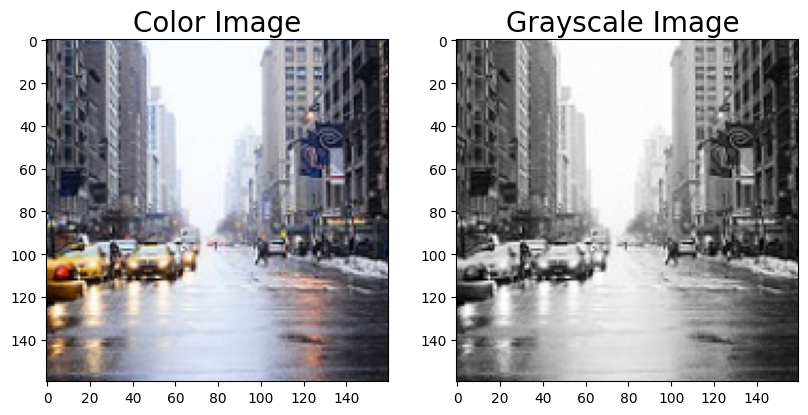

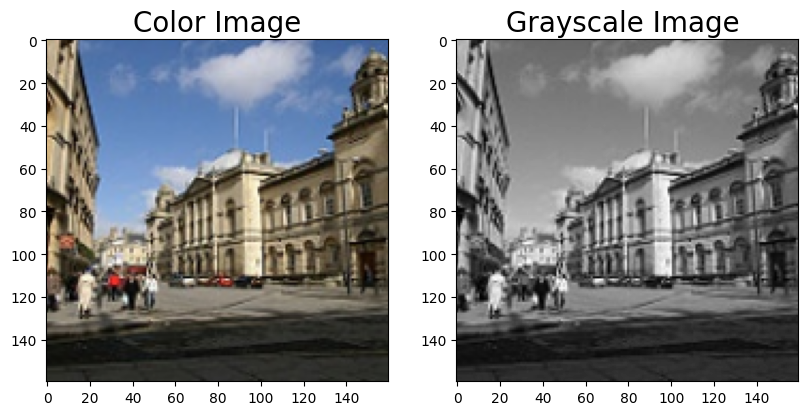

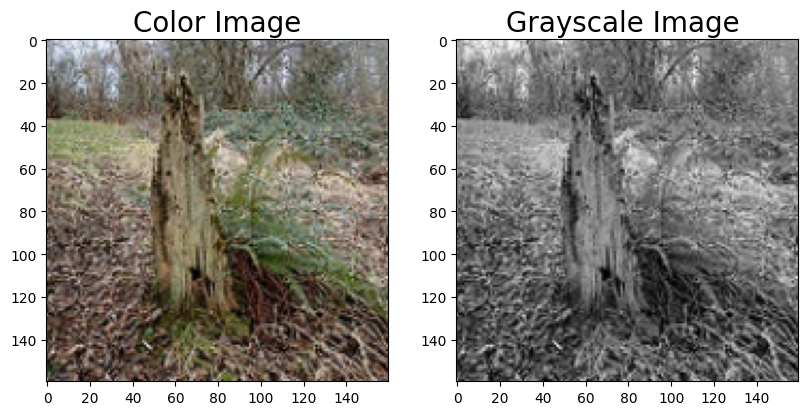

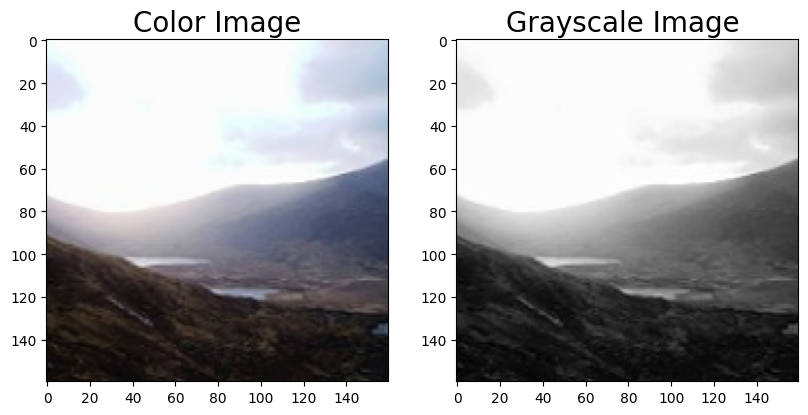

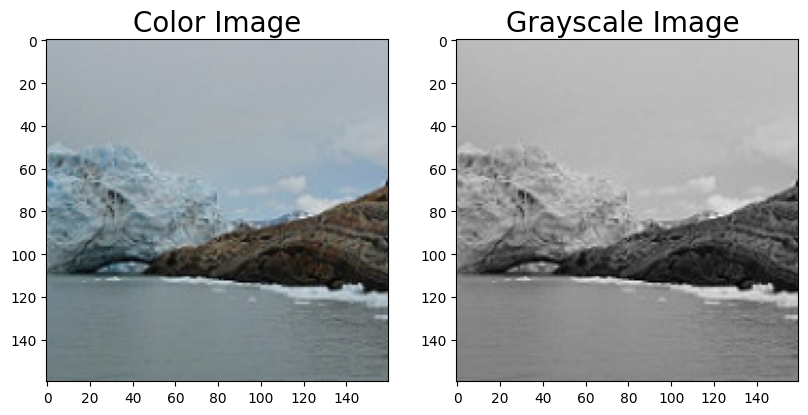

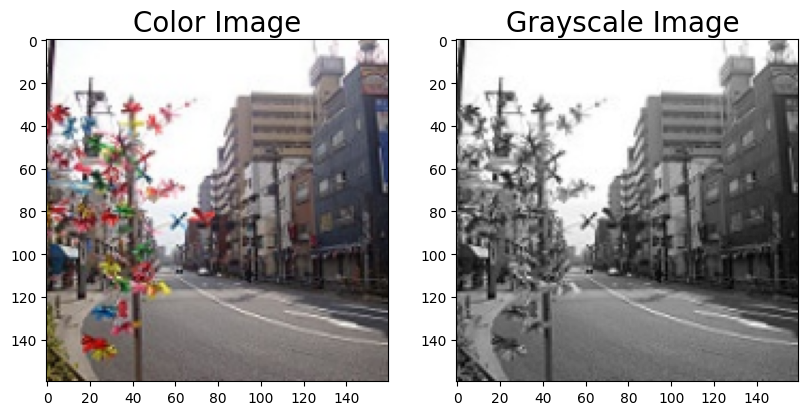

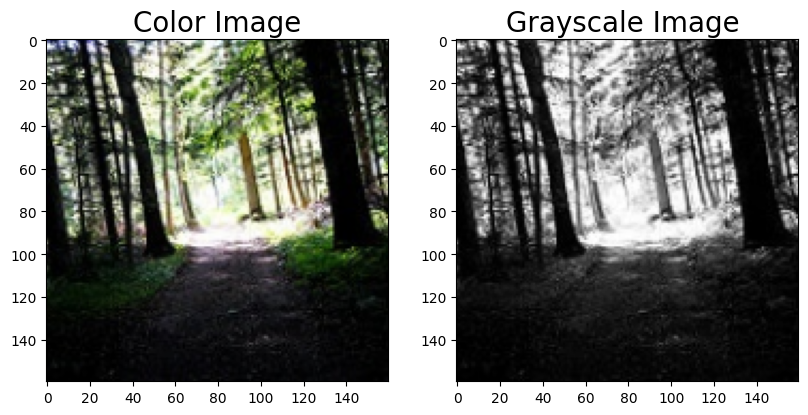

In [10]:
for i in range(23,30):
     plot_images(color_img[i],gray_img[i])

In [11]:
gray_img[23].shape, cv2.IMREAD_GRAYSCALE

((160, 160), 0)

In [12]:
class CustomDatasetRGB(torch.utils.data.Dataset):
    def __init__(self, images_c, images_g):
        self.images_c = images_c
        self.images_g = images_g

    def __getitem__(self, index):

        rgb_image = self.images_c[index]
        gray_image  = np.expand_dims(self.images_g[index], 0)
        rgb_image = np.transpose(rgb_image, axes=(2, 0, 1))
        return torch.from_numpy(rgb_image), torch.from_numpy(gray_image)

    def __len__(self):
        return len(self.images_g)





In [13]:
train_dataset = CustomDatasetRGB(color_img[:6000], gray_img[:6000])
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True)
test_dataset = CustomDatasetRGB(color_img[6000:], gray_img[6000:])
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=4)

torch.Size([4, 3, 160, 160])
torch.Size([4, 1, 160, 160])


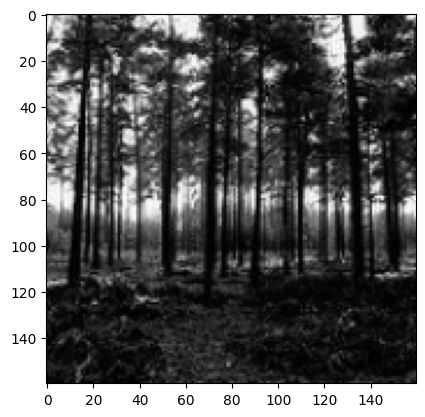

In [14]:
for c, g in train_loader:
  print(c.shape)
  print(g.shape)
  plt.imshow(c[0, :, :, :].detach().numpy().transpose(1, 2,0))
  plt.imshow(g[0, :, :, :].detach().numpy().transpose(1, 2,0), cmap='gray')
  break

In [15]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1,64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128,256, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256,
                               kernel_size=3,
                               stride=2,
                               padding=1,
                               output_padding=1),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(256, 128,
                               kernel_size=3,
                               stride=2,
                               padding=1,
                               output_padding=1),

             nn.LeakyReLU(),
            nn.ConvTranspose2d(128, 64,
                               kernel_size=3,
                               stride=2,
                               padding=1,
                               output_padding=1),
             nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 3,
                               kernel_size=3,
                               stride=2,
                               padding=1,
                               output_padding=1),
            # nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

        # Autoencoder(nn.Module):

torch.Size([4, 3, 160, 160])
torch.Size([4, 1, 160, 160])


torch.Size([4, 3, 160, 160])


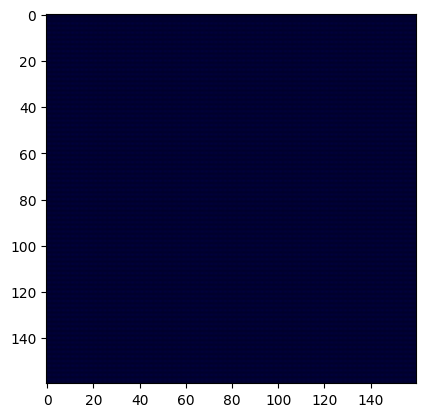

In [16]:
model = AutoEncoder()
for c, g in train_loader:
  print(c.shape)
  print(g.shape)
  outs = model(g)
  print(outs.shape)
  # plt.imshow(c[0, :, :, :].detach().numpy().transpose(1, 2,0))
  plt.imshow(outs[0, :, :, :].detach().numpy().transpose(1, 2,0), cmap='gray')
  break

In [17]:
criterion = torch.nn.L1Loss()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
optimizer = optim.Adam(model.parameters())


In [18]:
device

device(type='cuda', index=0)

In [19]:
from IPython import display
import matplotlib.pyplot as plt
def plot_loss(loss_history, clear_output=True):
    if clear_output:
        display.clear_output(wait=True)
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    if loss_history:
        ax.semilogy(loss_history)
        ax.set_title('Training loss')
        ax.set_xlabel('# batches processed')
        ax.set_ylabel('loss value')

    # if len(train_accuracy) > 0:
    #     ax[1].plot(train_accuracy, '*-b', label='train')
    #     ax[1].plot(val_accuracy, '*-r', label='test')
    #     ax[1].set_title('Accuracy')
    #     ax[1].legend()
    #     ax[1].set_xlabel('# epochs processed')
    #     ax[1].set_ylabel('accuracy value')

    plt.show()

In [22]:
# Train your autoencoder
# Visualize progress in reconstruction and loss decay
def train(epochs, net, criterion, optimizer, train_loader, val_loader, device):
    net.to(device)
    train_lgraph, train_agraph, test_agraph= [],[], []
    preds = []
    net.train()
    for epoch in range(0, epochs):
        net.train()
        train_loss_tot, val_loss_tot, train_loss =0, 0, []

        for C, G in train_loader:
            # Perform one step of minibatch stochastic gradient descent

            C = C.to(device)
            G = G.to(device)
            # >>> your solution here <<<
            nn_output = net(G)
            # print(X.shape, nn_output[1].shape)

            loss = criterion(nn_output, C)
            train_loss.append(loss.item())
            train_loss_tot += loss
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()


        train_loss_tot/= len(train_loader)
        # define NN evaluation, i.e. turn off dropouts, batchnorms, etc.
        net.eval()
        with torch.no_grad():
          for C_val, G_val in val_loader:

              C_val = C_val.to(device)
              G_val = G_val.to(device)
              # Compute the validation loss
              # >>> your solution here <<<
              nn_output_val = net(G_val)
              val_loss = criterion(nn_output_val, C_val)
              val_loss_tot += val_loss
              #print(val_loss.item())

        val_loss_tot  /= len(val_loader)
        train_lgraph.append(np.mean(train_loss))
        plot_loss(train_lgraph)



        freq = max(epochs//20,1)
        if epoch%1 == 0:
            print('Epoch {}/{} || Loss:  Train {:.4f} | Validation {:.4f}'.format(epoch, epochs, train_loss_tot, val_loss_tot))
            #print('Epoch {}/{} || Loss:  Train {:.4f} | Validation {:.4f}'.format(epoch, epochs, loss.item(), val_loss.item()))
    return train_lgraph, preds

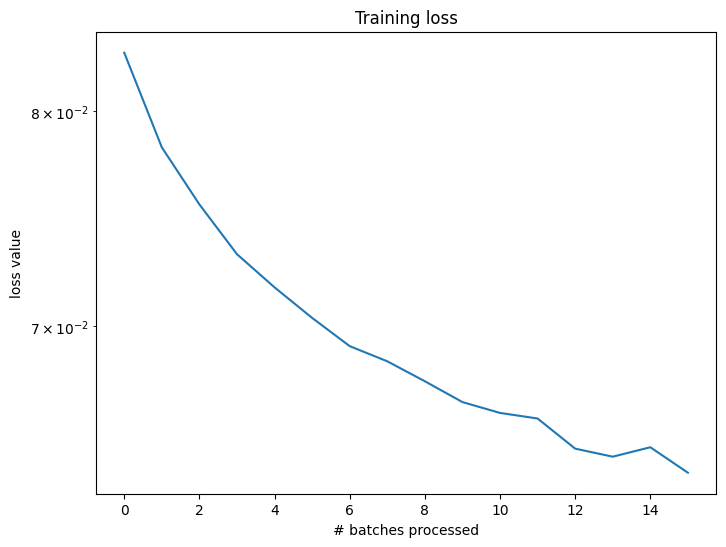

Epoch 15/16 || Loss:  Train 0.0639 | Validation 0.0660


In [23]:
train_lgraph, preds = train(16, model, criterion, optimizer, train_loader, test_loader, device)

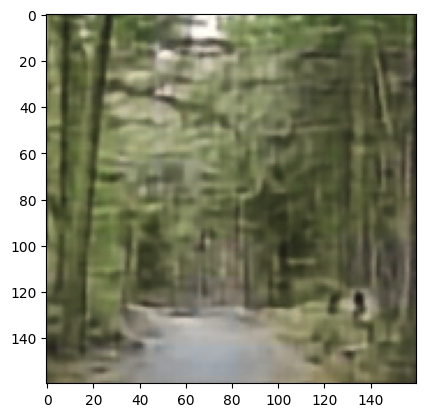

In [25]:
for ct, gt in test_loader:
  ct, gt = ct.to(device), gt.to(device)
  model = model.to(device)
  preds = model(gt)
  plt.imshow(preds.detach().cpu().numpy()[0, :, :, :].transpose(1,2,0))
  break

In [28]:
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale, cmap = 'gray')
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)

    plt.show()



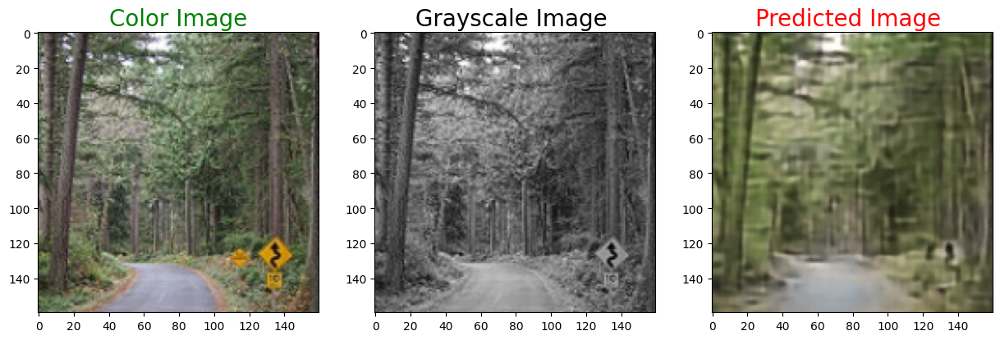

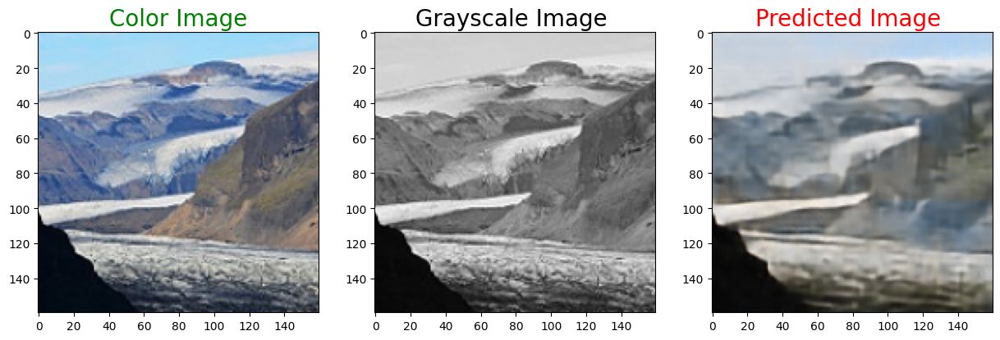

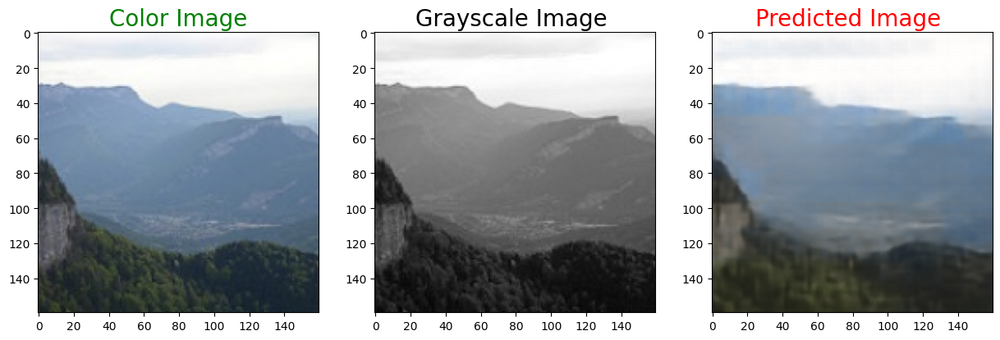

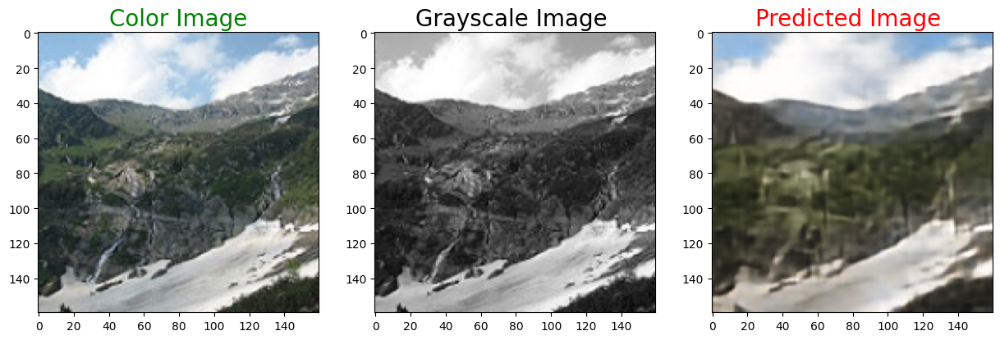

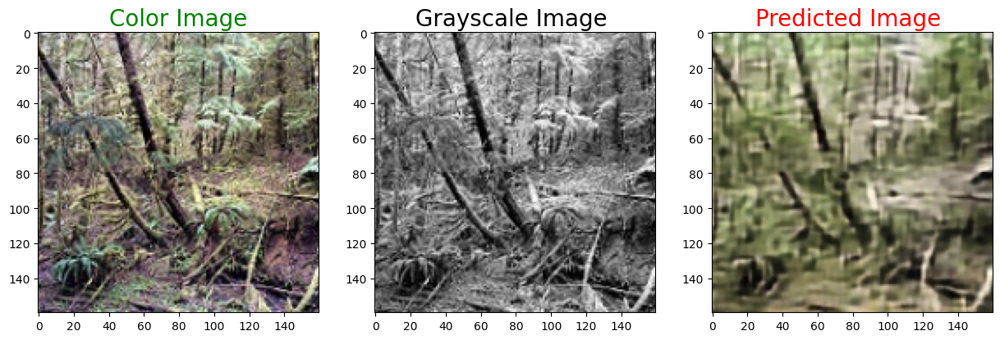

...

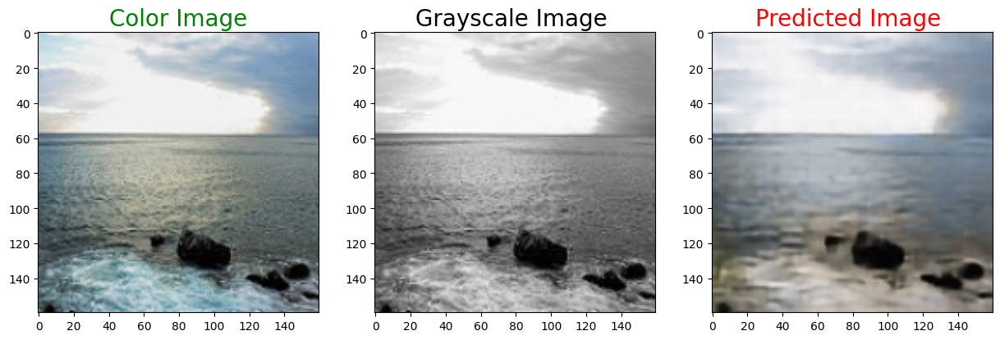

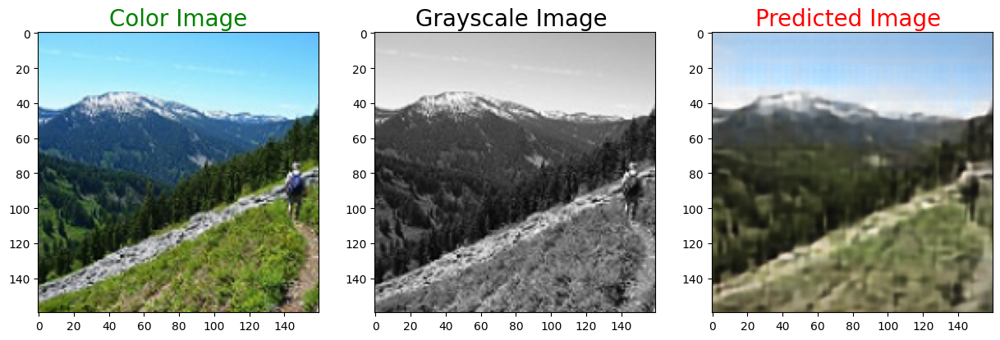

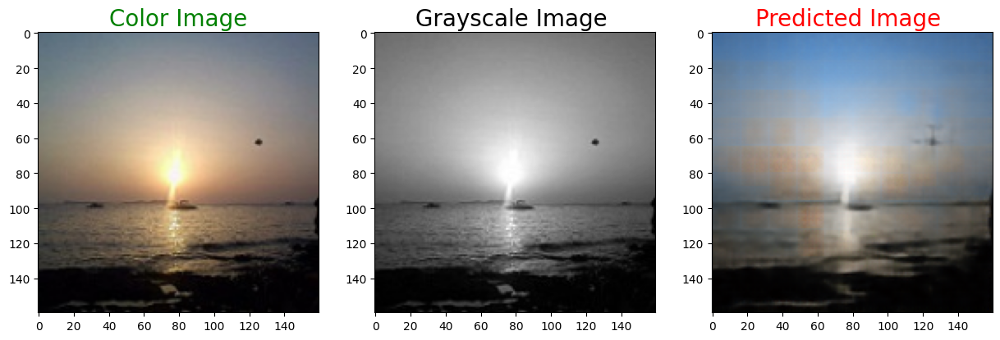

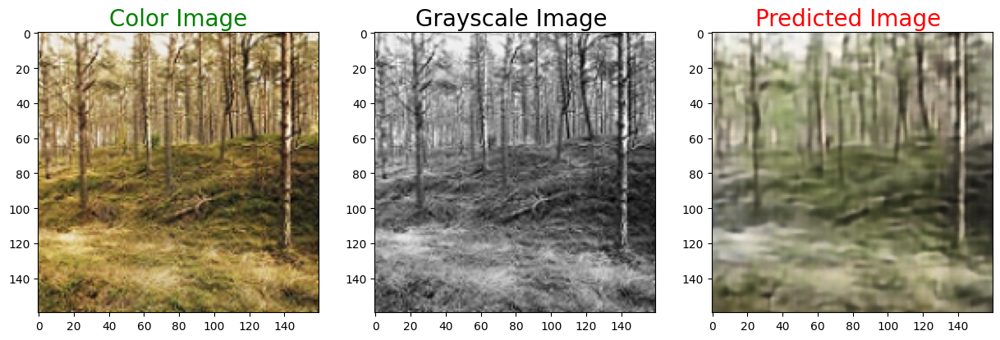

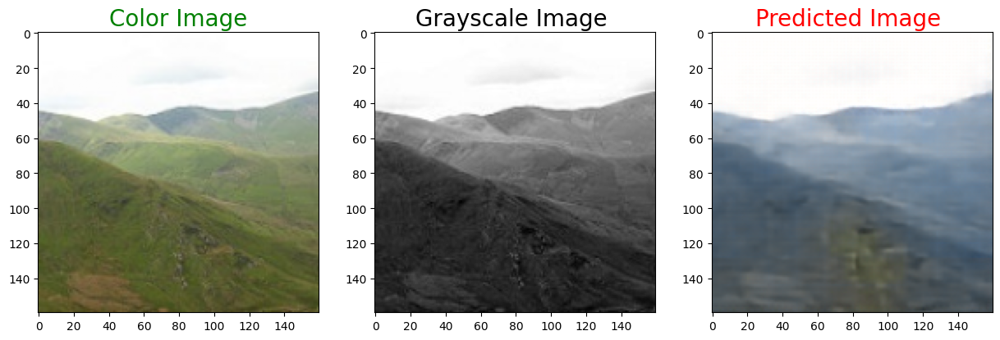

In [29]:
for i, (ct, gt) in enumerate(test_loader):
  ct, gt = ct.to(device), gt.to(device)
  model = model.to(device)
  preds = model(gt)
  p = preds.detach().cpu().numpy()[0, :, :, :].transpose(1,2,0)
  c = ct.detach().cpu().numpy()[0, :, :, :].transpose(1,2,0)
  g = gt.detach().cpu().numpy()[0, :, :, :].transpose(1,2,0)
  plot_images(c, g, p)
  if i ==10:
    break
